In [1]:
### Load necessary modules -------------------------------
# interactive plotting
%matplotlib inline
%config InlineBackend.figure_format = 'svg' # ‘png’, ‘retina’, ‘jpeg’, ‘svg’, ‘pdf’

# plotting libraries
import seaborn as sns
import matplotlib.pyplot as plt
sns.set()
sns.set_theme()

# Data management libraries
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import math

# Machine learning libraries
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, KFold
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, PolynomialFeatures
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.compose import ColumnTransformer
from scipy.stats import norm
from sklearn.metrics import accuracy_score
from sklearn.calibration import CalibratedClassifierCV
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from neuralsens import partial_derivatives as ns


from funciones_previas import *
from funciones_clasificacion import *

# CARGA CSVs

In [2]:
#He eliminado las últimas 12 columnas pues sobraban

df_plots = pd.read_csv("plot_all_data_20241206_115219_limpio.csv", sep = ";")
df_plots = df_plots.reset_index()

# Eliminar el primer registro (primera fila)
df_plots = df_plots.drop(index=0)

#Renombro las columnas
df_plots.columns = ['time', 'utc', 'sample', 'PPC_PMG', 'PPC_QMG', 'PMG_M', 'QMG_M', 'UL1_RMS', 'UL2_RMS', 'UL3_RMS', 'IT1_RMS', 'IT2_RMS',
                    'IT3_RMS', 'UDC1_FIL', 'UDC2_FIL', 'VPV1_FIL', 'VPV2_FIL', 'TSOC', 'TCCU','TEXTERIOR', 'TCAB_AC','TCAB_POT1', 'TCAB_POT2',
                    'TDC_FUSES', 'TBRID11', 'TBRID12', 'TBRID13', 'TBRID21', 'TBRID22', 'TBRID23', 'TCOILIND1', 'TCOILIND2', 'TCOREIND1', 
                    'TCOREIND2', 'TCOOLINGI', 'TCOOLINGO', 'TAIR_INLET', 'TAIR_OUTLET', 'THFILTER', 'DPF_HUM_INT', 'DPF_TEMP_INT']

df_plots.head(5)

/var/folders/wn/gxtmyy811gg8d_h61xk9hfkm0000gn/T/ipykernel_1403/3518333641.py:3: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40) have mixed types. Specify dtype option on import or set low_memory=False.
  df_plots = pd.read_csv("plot_all_data_20241206_115219_limpio.csv", sep = ";")


,time,utc,sample,PPC_PMG,PPC_QMG,PMG_M,QMG_M,UL1_RMS,UL2_RMS,UL3_RMS,...,TCOILIND2,TCOREIND1,TCOREIND2,TCOOLINGI,TCOOLINGO,TAIR_INLET,TAIR_OUTLET,THFILTER,DPF_HUM_INT,DPF_TEMP_INT
1,2024-12-04T09:25:42,1733304342,0,0.000000,0.000000,-364.684570,371.257172,394.683197,393.480194,395.056152,...,18.573898,20.323036,18.390059,17.794167,17.196388,22.412518,19.318895,14.843167,0.000000,0.000000
2,2024-12-04T09:25:44,1733304344,1,0.000000,0.000000,-28354.960938,-23345.810547,393.304596,393.906952,395.414886,...,18.573898,20.323036,18.390059,17.794189,17.532743,22.412518,19.318895,14.843167,0.000000,0.000000
3,2024-12-04T09:25:46,1733304346,2,4504000.000000,0.000000,-3021.393799,-1532.406860,393.450714,394.034943,395.552368,...,18.573898,20.323036,18.390059,17.794189,17.532743,22.412518,19.318895,14.843167,0.000000,0.000000
4,2024-12-04T09:25:48,1733304348,3,4504000.000000,0.000000,-3015.009521,-1502.439331,393.505585,394.101624,395.657379,...,18.573898,20.323036,18.390059,18.129883,17.868933,22.412518,19.318895,14.843167,0.000000,0.000000
5,2024-12-04T09:25:50,1733304350,4,4504000.000000,0.000000,-3069.748779,-1559.467407,394.697784,393.518311,395.041809,...,18.573898,20.323036,18.390059,18.129883,17.868933,22.412518,19.318895,14.843167,0.000000,0.000000


In [3]:
len(df_plots)

26943

# EXPLORATORY DATA ANALYSIS

In [4]:
df_plots.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26943 entries, 1 to 26943
Data columns (total 41 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   time          26943 non-null  object
 1   utc           26943 non-null  object
 2   sample        26943 non-null  object
 3   PPC_PMG       26943 non-null  object
 4   PPC_QMG       26943 non-null  object
 5   PMG_M         26943 non-null  object
 6   QMG_M         26943 non-null  object
 7   UL1_RMS       26943 non-null  object
 8   UL2_RMS       26943 non-null  object
 9   UL3_RMS       26943 non-null  object
 10  IT1_RMS       26943 non-null  object
 11  IT2_RMS       26943 non-null  object
 12  IT3_RMS       26943 non-null  object
 13  UDC1_FIL      26943 non-null  object
 14  UDC2_FIL      26943 non-null  object
 15  VPV1_FIL      26943 non-null  object
 16  VPV2_FIL      26943 non-null  object
 17  TSOC          26943 non-null  object
 18  TCCU          26943 non-null  object
 19  TEXT

In [5]:
df_plots.dtypes

time            object
utc             object
sample          object
PPC_PMG         object
PPC_QMG         object
PMG_M           object
QMG_M           object
UL1_RMS         object
UL2_RMS         object
UL3_RMS         object
IT1_RMS         object
IT2_RMS         object
IT3_RMS         object
UDC1_FIL        object
UDC2_FIL        object
VPV1_FIL        object
VPV2_FIL        object
TSOC            object
TCCU            object
TEXTERIOR       object
TCAB_AC         object
TCAB_POT1       object
TCAB_POT2       object
TDC_FUSES       object
TBRID11         object
TBRID12         object
TBRID13         object
TBRID21         object
TBRID22         object
TBRID23         object
TCOILIND1       object
TCOILIND2       object
TCOREIND1       object
TCOREIND2       object
TCOOLINGI       object
TCOOLINGO       object
TAIR_INLET      object
TAIR_OUTLET     object
THFILTER        object
DPF_HUM_INT     object
DPF_TEMP_INT    object
dtype: object

In [6]:
df_plots.describe().T

#Vemos que todas las columnas presentan 26943 registros por lo que no tenemos valores Nan.
#Las variables PPC_QMG, DPF_HUM_INT y DPF_TEMP_INT solo tienen dos valores distintos por lo que sería interesante categorizarlas.
#Tenemos información del valor máximo de cada variable y la frecuencia con la que aparece cada uno.

#freq: Es la frecuencia de la modalidad más frecuente en esa columna. Es decir, cuántas veces aparece el valor que más se repite.

#top: Es el valor más frecuente de la columna, o sea, el modo de los datos. Este es el valor que aparece más veces en la columna.

#unique: Es el número total de valores únicos en la columna. Es decir, cuántos valores diferentes existen en esa columna, sin contar repeticiones.

,count,unique,top,freq
time,26943,26943,2024-12-04T09:25:42,1
utc,26943,26943,1733304342,1
sample,26943,26943,0,1
PPC_PMG,26943,172,4504000.000000,16210
PPC_QMG,26943,2,0.000000,16383
PMG_M,26943,26472,-3964.718506,3
QMG_M,26943,26755,-1432.475952,3
UL1_RMS,26943,24740,393.708344,5
UL2_RMS,26943,24899,392.462341,4
UL3_RMS,26943,24858,393.593262,5


In [7]:
#De estas columnas que tienen únicamente dos calores distintos, vamos a ver cuáles son:

print(df_plots['PPC_QMG'].unique())
print(df_plots['DPF_HUM_INT'].unique())
print(df_plots['DPF_TEMP_INT'].unique())

['0.000000' 0.0]
['0.000000' 0.0]
['0.000000' 0.0]


## Conversión de los tipos de las columnas

In [8]:
#Vamos a transformar las columnas a los siguientes tipos:
# - time: timestamp
# - utc y sample: int
# - resto: float

df_plots['time'] = pd.to_datetime(df_plots['time'])
df_plots['utc'] = df_plots['utc'].astype(int) #no lo convierto a timestamp pues ya tenemos la columna time
df_plots['sample'] = df_plots['sample'].astype(int)
cols_float = ['PPC_PMG', 'PPC_QMG', 'PMG_M', 'QMG_M', 'UL1_RMS', 'UL2_RMS', 'UL3_RMS', 'IT1_RMS', 'IT2_RMS',
                'IT3_RMS', 'UDC1_FIL', 'UDC2_FIL', 'VPV1_FIL', 'VPV2_FIL', 'TSOC', 'TCCU','TEXTERIOR', 'TCAB_AC','TCAB_POT1', 'TCAB_POT2',
                'TDC_FUSES', 'TBRID11', 'TBRID12', 'TBRID13', 'TBRID21', 'TBRID22', 'TBRID23', 'TCOILIND1', 'TCOILIND2', 'TCOREIND1', 
                'TCOREIND2', 'TCOOLINGI', 'TCOOLINGO', 'TAIR_INLET', 'TAIR_OUTLET', 'THFILTER', 'DPF_HUM_INT', 'DPF_TEMP_INT'
             ]
for col in cols_float:
    df_plots[col] = df_plots[col].astype(float)

df_plots.describe().T

# - Efectivamente, las columnas PPC_QMG, DPF_HUM_INT y DPF_TEMP_INT solo tienen valor nulo
# - PMG_M tiene un rango bastante amplio de valores el 75% de los datos son menores que -3970.4 mientras que el máximo es de 187263.03 por lo 
#   que es probable la presencia de outliers
# - QMG_M tiene un rango bastante amplio de valores el 75% de los datos son menores que -1441.27 mientras que el máximo es de 173558.89 por lo 
#   que es probable la presencia de outliers
# - UL1_RMS, UL2_RMS, UL3_RMS tienen rangos de valores no muy grandes
# - IT1_RMS, IT2_RMS tienen rango de valores bastante elevado. Mucha diferencia entre el valor del tercer cuartil al máximo de esa columna. Por 
#   otra parte IT3_RMS tiene un rango más pequeño
# - UDC1_FIL, UDC2_FIL valores no muy dispersos. De hecho tienen métricas muy parecidas
# - VPV1_FIL, VPV2_FIL  tienen mucha diferencia entre el tercer cuartil y el máximo (estos valores situados en ese rango quizá nos dan información
#   de situaciones extremas)
# - TSOC, TCCU, TEXTERIOR, TCAB_AC, TCAB_POT1, TCAB_POT2, TDC_FUSES (información de temperaturas ambiente). Sin mucha dispersión en los datos
# - TBRID11, TBRID12, TBRID13, TBRID21, TBRID22, TBRID23 (info temperatura Skiip) tienen rangos muy parecidos sin mucha dispersión 
# - TCOILIND1, TCOILIND2, TCOREIND1, TCOREIND1 (info temperatura de inductancia) tienen rangos no muy amplios y similares dos a dos
# - TCOOLINGI, TCOOLINGO rangos parecidos
# - TAIRINLET, TAIR_OUTLET rangos parecidos
# - THFILTER rango no muy amplio


,count,mean,min,25%,50%,75%,max,std
time,26943,2024-12-04 16:54:44.886501120,2024-12-04 09:25:42,2024-12-04 13:10:13,2024-12-04 16:54:45,2024-12-04 20:39:17,2024-12-05 00:23:48,NaN
utc,26943.0,1733331284.886501,1733304342.0,1733317813.0,1733331285.0,1733344757.0,1733358228.0,15556.572537
sample,26943.0,13471.0,0.0,6735.5,13471.0,20206.5,26942.0,7777.918488
PPC_PMG,26943.0,4477222.766581,0.0,4504000.0,4504000.0,4504000.0,4504000.0,320797.642132
PPC_QMG,26943.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
PMG_M,26943.0,-4022.590593,-162032.75,-4041.654663,-4012.050781,-3970.407715,187263.03125,16235.105757
QMG_M,26943.0,-1524.362476,-196469.109375,-1493.206848,-1461.557007,-1441.27124,173558.890625,17030.25819
UL1_RMS,26943.0,393.012426,387.222839,392.393676,393.062622,393.672059,395.85202,1.031186
UL2_RMS,26943.0,392.232353,386.294189,391.685501,392.315369,392.861618,395.630219,1.21441
UL3_RMS,26943.0,393.533876,387.994781,392.918029,393.538818,394.184021,397.153748,1.201902


## Gráficos de las variables para ver su distribución

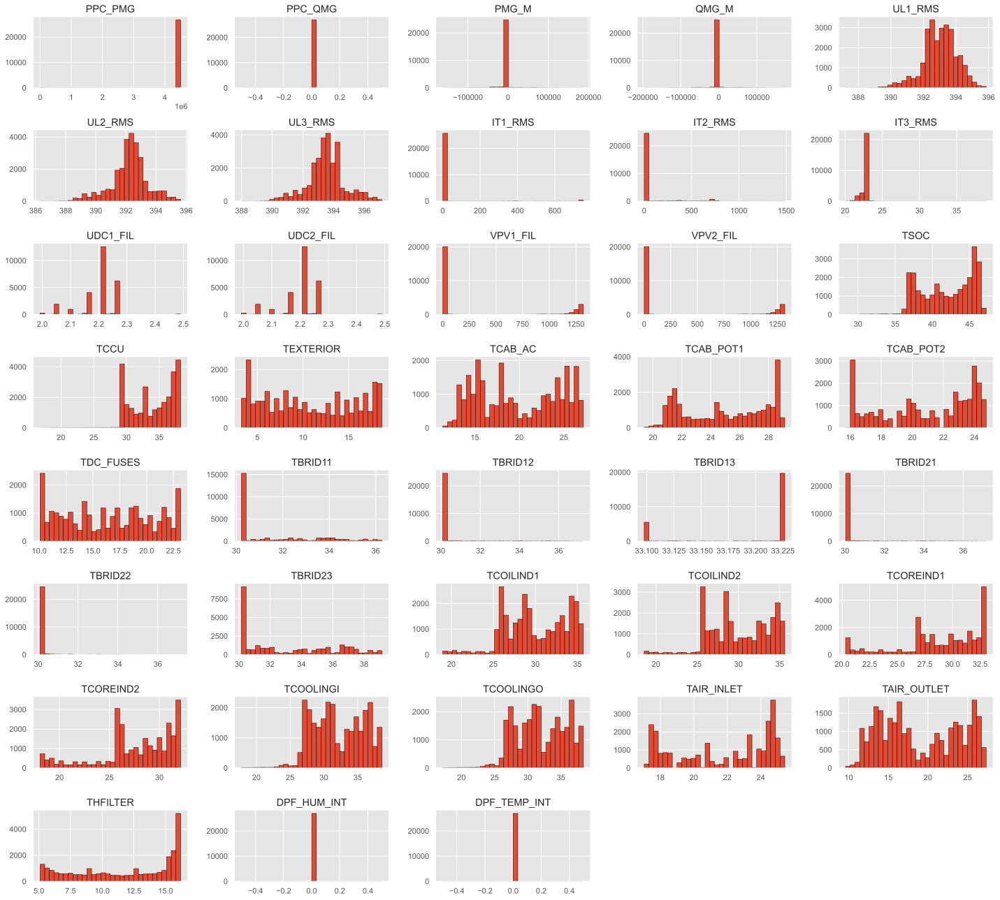

In [9]:
#No realizo el histograma de time, utc ni sample pues no aporta información relevante
columnas_a_dibujar = ['PPC_PMG', 'PPC_QMG', 'PMG_M', 'QMG_M', 'UL1_RMS', 'UL2_RMS', 'UL3_RMS', 'IT1_RMS', 'IT2_RMS',
                'IT3_RMS', 'UDC1_FIL', 'UDC2_FIL', 'VPV1_FIL', 'VPV2_FIL', 'TSOC', 'TCCU','TEXTERIOR', 'TCAB_AC','TCAB_POT1', 'TCAB_POT2',
                'TDC_FUSES', 'TBRID11', 'TBRID12', 'TBRID13', 'TBRID21', 'TBRID22', 'TBRID23', 'TCOILIND1', 'TCOILIND2', 'TCOREIND1', 
                'TCOREIND2', 'TCOOLINGI', 'TCOOLINGO', 'TAIR_INLET', 'TAIR_OUTLET', 'THFILTER', 'DPF_HUM_INT', 'DPF_TEMP_INT'
             ]
# Ajustar el tamaño de la figura y la distribución de subgráficos
df_plots[columnas_a_dibujar].hist(figsize=(20, 20), bins=30, layout=(9, 5), edgecolor='black')

plt.tight_layout()  # Ajusta los espacios entre gráficos
plt.savefig("./img/HistogramasVariables.png")
plt.show()

In [12]:

def boxplots(df):
    """
    Función que dado un dataframe df grafica los boxplots para toda columna de tipo numérico. Además, muestra la media de esa columna en el 
    boxplot con un alínea discontinua
    """
    # Seleccionar solo las columnas numéricas
    columnas_numericas = list(df.select_dtypes(include=['number']).columns)
    columnas_a_eliminar = ['utc', 'sample']

    for col in columnas_a_eliminar:
        if col in columnas_numericas:
            columnas_numericas.remove(col)
    
    # Calcular el número de subgráficos necesarios
    num_cols = len(columnas_numericas)
    
    # Calcular el número de filas y columnas para el layout
    num_filas = int(np.ceil(num_cols / 4))
    num_columnas = min(num_cols, 4)  # Maximizamos a 4 columnas
    
    # Crear la figura con el layout adecuado
    plt.figure(figsize=(10 * num_columnas, 6 * num_filas))
    
    # Crear un gráfico para cada columna numérica
    for i, col in enumerate(columnas_numericas):
        plt.subplot(num_filas, num_columnas, i + 1)  # Colocar el gráfico en la subfigura correspondiente
        ax = sns.boxplot(x=df[col])  # Boxplot sin la media mostrada como marcador
        
        # Calcular la media
        media = df[col].mean()
        
        # Dibujar una línea punteada para la media
        plt.axvline(media, color='black', linestyle='--', linewidth=1, label='Media')  # Línea punteada
        
        # Agregar la leyenda (solo para el primer gráfico)
        if i == 0:
            ax.legend(loc='upper right', fontsize=10, title='Líneas')
        
        plt.title(f'Boxplot de {col}')  # Título con el nombre de la columna
    
    # Ajustar los espacios entre los gráficos
    plt.tight_layout()
    plt.savefig("./img/BoxplotsVariables")
    plt.show()



boxplots(df_plots)

#Quizá resulte interesante normalizar las columnas: PPC_PMG, QMG_M, PMG_M, IT1_RMS, IT2_RMS, IT3_RMS, TBRID_12, TBRID_21, TBRID22

## Gráficos de las variables para ver correlaciones entre ellas

Columnas no numéricas en el DataFrame original:
Index(['time'], dtype='object')


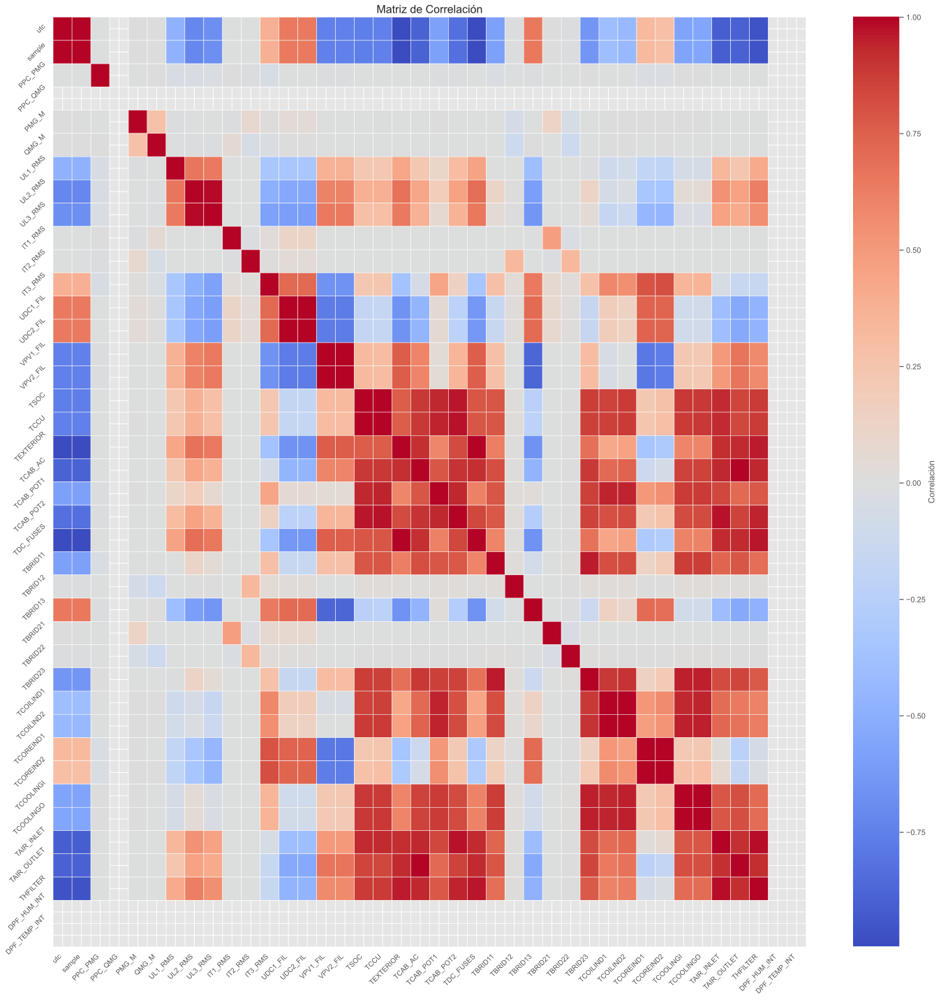

In [13]:

def matriz_correlacion(df):
    # Seleccionar solo las columnas numéricas
    df_numerico = df.select_dtypes(include=['number'])
    
    # Mostrar las columnas que no están en df_numerico
    columnas_no_numericas = df.columns.difference(df_numerico.columns)
    print("Columnas no numéricas en el DataFrame original:")
    print(columnas_no_numericas)
    
    # Calcular la matriz de correlación
    correlacion = df_numerico.corr()
    
    # Crear una máscara para los valores NaN
    mask_nan = correlacion.isna()  # Esto será un DataFrame con True donde hay NaN
    
    # Reemplazar NaN con un valor específico para que el heatmap lo pueda dibujar
    correlacion_filled = correlacion.fillna(-1)  # -1 será el valor temporal para los NaN
    
    # Calcular el tamaño de la figura en función del número de columnas
    num_cols = len(df_numerico.columns)
    
    # Ajustar el tamaño dinámicamente según la cantidad de columnas
    fig_size = (num_cols * 0.5, num_cols * 0.5)  # Tamaño ajustado de la figura
    
    # Crear el gráfico
    plt.figure(figsize=fig_size)
    
    # Dibujar el heatmap, usando un color específico para los NaN
    ax = sns.heatmap(correlacion_filled, annot=False, cmap='coolwarm', linewidths=0.5, cbar_kws={'label': 'Correlación'},
                     xticklabels=correlacion.columns, yticklabels=correlacion.columns, mask=mask_nan)
    
    # Añadir título
    plt.title("Matriz de Correlación", fontsize=16)
    
    # Ajustar las etiquetas para que no se solapen
    plt.xticks(rotation=45, ha='right', fontsize=10)  # Rotar las etiquetas del eje x
    plt.yticks(rotation=45, ha='right', fontsize=10)  # Rotar las etiquetas del eje y
    
    # Ajustar el diseño para evitar que se solapen
    plt.tight_layout()
    
    # Ajustar la posición de la barra de color (colorbar)
    #plt.colorbar(ax.collections[0], ax=ax, fraction=0.02, pad=0.04)  # Ajustar la barra de color
    
    # Mostrar el gráfico
    plt.savefig("./img/Matrizcorrelaciones")
    plt.show()


matriz_correlacion(df_plots)

#Observamos que tenemos valores Nan en las correlaciones de las columnas PPC_QMG, DPF_HUM_INT y DPF_TEMP_INT. Esto se debe a que estas columnas
#tiene un único valor por lo que su desviación estándar es cero y la correlación, como implica dividir por esta desviación, nos devuelev Nan.

In [8]:

def variables_altamente_correlacionadas(df, umbral=0.95):
    """
    Dado un df y un umbral (por defecto es 0.8) devuelve un array de arrays. Cada subarray es un grupo de variables que tiene una correlación
    igual o superior entre ellas. 
    Para el proceso de creación de estos subarrays, estamos aplicando la correlación transitiva, es decir, si las variables A y B están 
    altamente correlacionadas entre si y las variables B y C están altamente correlacionadas entonces las variables A y C también lo estarán.
    """
    # Seleccionar solo las columnas numéricas
    df_numerico = df.select_dtypes(include=['number'])
    
    # Calcular la matriz de correlación
    correlacion = df_numerico.corr()
    
    # Inicializar una lista para almacenar los grupos de variables correlacionadas
    grupos_correlacionados = []
    
    # Crear un conjunto para hacer un seguimiento de las variables ya agrupadas
    ya_agrupadas = set()

    # Recorrer la matriz de correlación para encontrar correlaciones altas
    for i in range(len(correlacion.columns)):
        for j in range(i):
            if abs(correlacion.iloc[i, j]) >= umbral:
                # Si las variables no están ya agrupadas, se crea un nuevo grupo
                if correlacion.columns[i] not in ya_agrupadas and correlacion.columns[j] not in ya_agrupadas:
                    grupo = {correlacion.columns[i], correlacion.columns[j]}
                    ya_agrupadas.update(grupo)
                    grupos_correlacionados.append(list(grupo))
                # Si solo una de las variables está agrupada, agregamos la otra a ese grupo
                elif correlacion.columns[i] in ya_agrupadas and correlacion.columns[j] not in ya_agrupadas:
                    ya_agrupadas.add(correlacion.columns[j])
                    grupos_correlacionados[-1].append(correlacion.columns[j])
                elif correlacion.columns[j] in ya_agrupadas and correlacion.columns[i] not in ya_agrupadas:
                    ya_agrupadas.add(correlacion.columns[i])
                    grupos_correlacionados[-1].append(correlacion.columns[i])
                
                # En este punto, verificamos si alguna de las variables está relacionada con otras ya agrupadas
                # Si alguna de las dos está en un grupo existente, las añadimos a ese grupo.
                for grupo in grupos_correlacionados:
                    if correlacion.columns[i] in grupo and correlacion.columns[j] not in grupo:
                        grupo.append(correlacion.columns[j])
                        ya_agrupadas.add(correlacion.columns[j])
                    elif correlacion.columns[j] in grupo and correlacion.columns[i] not in grupo:
                        grupo.append(correlacion.columns[i])
                        ya_agrupadas.add(correlacion.columns[i])

    # Eliminar subgrupos de tamaño 1 
    grupos_correlacionados = [grupo for grupo in grupos_correlacionados if len(grupo) > 1]

    return grupos_correlacionados

var_muy_correlacionadas = variables_altamente_correlacionadas(df_plots)
var_muy_correlacionadas

[['sample', 'utc', 'TEXTERIOR', 'TDC_FUSES', 'THFILTER', 'TAIR_INLET'],
 ['UL2_RMS', 'UL3_RMS'],
 ['UDC2_FIL', 'UDC1_FIL'],
 ['VPV2_FIL', 'VPV1_FIL'],
 ['TSOC',
  'TCCU',
  'TEXTERIOR',
  'utc',
  'sample',
  'TCAB_POT2',
  'TDC_FUSES',
  'TAIR_INLET',
  'THFILTER'],
 ['TBRID23', 'TBRID11', 'TCOOLINGI', 'TCOILIND2', 'TCOOLINGO'],
 ['TCOILIND1', 'TCOILIND2', 'TCOOLINGI', 'TCOOLINGO'],
 ['TCOREIND1',
  'TCOREIND2',
  'TCOOLINGI',
  'TBRID23',
  'TCOILIND2',
  'TCOOLINGO',
  'TAIR_INLET',
  'TCAB_POT2',
  'THFILTER'],
 ['TCAB_AC',
  'TAIR_OUTLET',
  'THFILTER',
  'utc',
  'sample',
  'TEXTERIOR',
  'TDC_FUSES',
  'TAIR_INLET']]

In [9]:
def plot_correlated_pairplot(df, correlated_vars):
    """
    Genera un pairplot de las variables en la lista correlated_vars dentro del DataFrame df.
    
    :param df: DataFrame de pandas con los datos.
    :param correlated_vars: Lista de nombres de columnas altamente correlacionadas.
    """
    if not all(var in df.columns for var in correlated_vars):
        raise ValueError("Algunas variables en la lista no están en el DataFrame")
    
    sns.pairplot(df[correlated_vars], diag_kind='kde', plot_kws={'alpha':0.5})
    plt.show()

In [ ]:
plot_correlated_pairplot(df_plots, var_muy_correlacionadas[0])